In [15]:
import pickle
import numpy as np
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
import matplotlib.pyplot as plt

In [8]:
embedding_file_path = "runs/simgcl/user_embedding.pkl"

In [9]:
with open(embedding_file_path, 'rb') as f:
    user_embeddings = pickle.load(f)

print(f"Loaded {len(user_embeddings)} user embeddings.")

Loaded 36751 user embeddings.


In [10]:
embedding_matrix = np.array(list(user_embeddings.values()))

In [11]:
scaler = StandardScaler()
embedding_matrix_scaled = scaler.fit_transform(embedding_matrix)

In [12]:
dbscan = DBSCAN(eps=1, min_samples=3, metric='euclidean')
cluster_labels = dbscan.fit_predict(embedding_matrix_scaled)

In [13]:
print(f"Number of clusters found: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise points (labeled -1): {list(cluster_labels).count(-1)}")

Number of clusters found: 2
Number of noise points (labeled -1): 36745


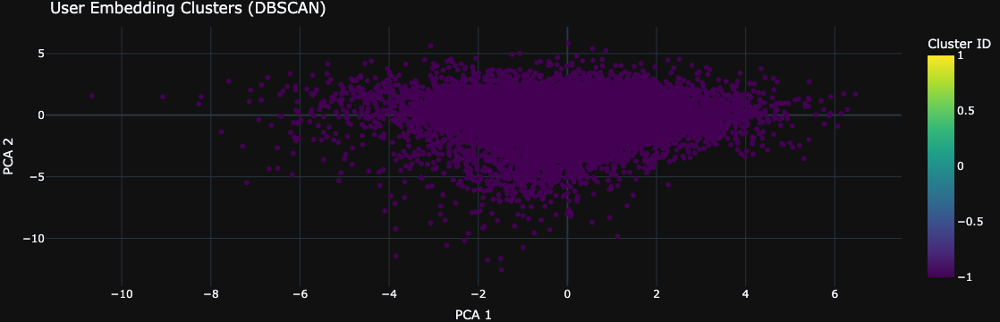

In [16]:
pca = PCA(n_components=2)
reduced_embeddings = pca.fit_transform(embedding_matrix_scaled)

# Create a DataFrame for easy plotting with Plotly
import pandas as pd

df = pd.DataFrame(reduced_embeddings, columns=['PCA Component 1', 'PCA Component 2'])
df['Cluster'] = cluster_labels

# Step 6: Create the interactive plot with Plotly
fig = px.scatter(
    df, 
    x='PCA Component 1', 
    y='PCA Component 2', 
    color='Cluster', 
    title="User Embedding Clusters (DBSCAN)",
    labels={"Cluster": "Cluster ID", "PCA Component 1": "PCA 1", "PCA Component 2": "PCA 2"},
    color_continuous_scale='Viridis',  # Customize color scale
    template="plotly_dark"  # Optional: Change the theme to dark mode
)

# Customize layout to make it more user-friendly
fig.update_layout(
    hovermode='closest',  # Display hover info for the nearest point
    xaxis_title="PCA 1", 
    yaxis_title="PCA 2",
    showlegend=True,
    margin=dict(l=0, r=0, t=30, b=0)  # Adjust margins for better layout
)

# Step 7: Show the plot
fig.show()

t-SNE KL Divergence: 2.276519298553467


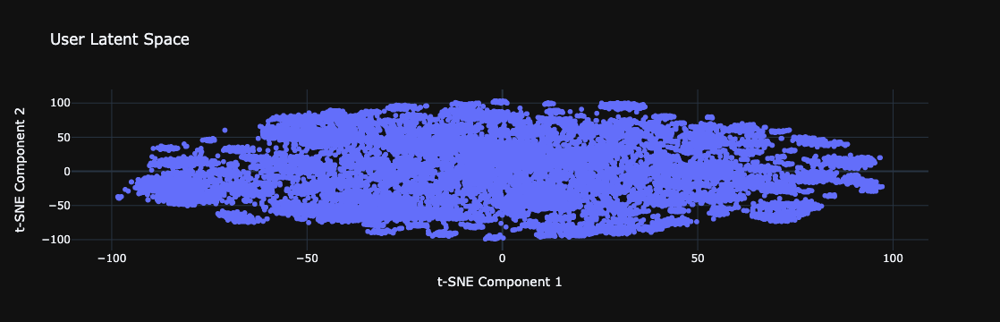

In [17]:
import pickle
import numpy as np
from sklearn.manifold import TSNE  # You can also use UMAP from cuML or sklearn
import plotly.express as px

# Load the user embeddings
embedding_file_path = 'runs/lightgcn_emb/user_embedding.pkl'

with open(embedding_file_path, 'rb') as f:
    user_embeddings = pickle.load(f)

# Convert the embeddings into a NumPy array (make sure it's in the right shape)
embedding_matrix = np.array(list(user_embeddings.values()))

# Dimensionality Reduction using t-SNE
tsne = TSNE(n_components=2, random_state=42, init='pca', metric='euclidean', method="barnes_hut")
X_tsne = tsne.fit_transform(embedding_matrix)

# Optional: Get the t-SNE divergence (useful for diagnostic purposes)
print(f"t-SNE KL Divergence: {tsne.kl_divergence_}")

# Visualize the results using Plotly
# Create a DataFrame for easy plotting
import pandas as pd
df = pd.DataFrame(X_tsne, columns=["TSNE Component 1", "TSNE Component 2"])

# If you have any labels (e.g., cluster IDs or user types), you can add them to the DataFrame
# Example: df['Cluster'] = cluster_labels  # If you have cluster labels

# Create the Plotly scatter plot
fig = px.scatter(df, x="TSNE Component 1", y="TSNE Component 2",
                 title="User Latent Space (t-SNE)",
                 labels={"TSNE Component 1": "Dimension 1", "TSNE Component 2": "Dimension 2"},
                 template="plotly_dark")  # Optional: use dark theme

# Update layout for better readability
fig.update_layout(
    title="User Latent Space",
    xaxis_title="t-SNE Component 1",
    yaxis_title="t-SNE Component 2",
    showlegend=False  # Set to True if you want to display legends (e.g., for clusters)
)

# Show the interactive plot
fig.show()


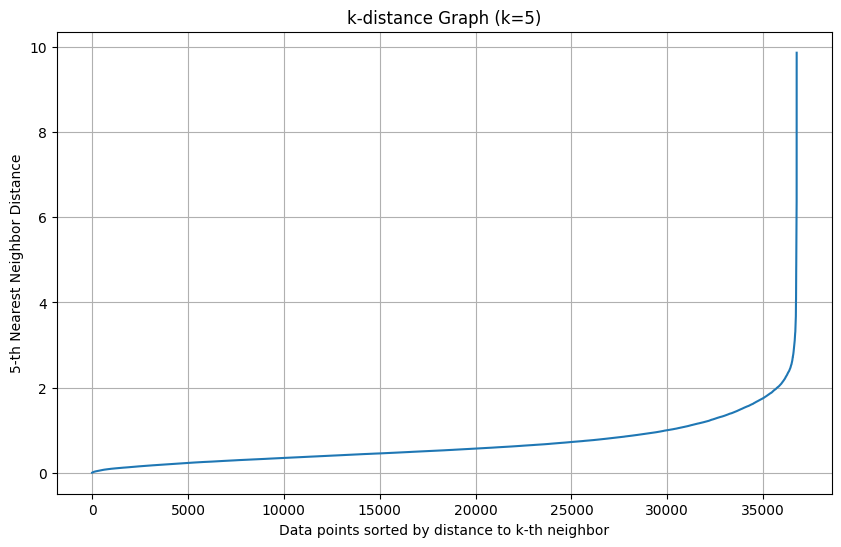

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

# Compute the k-nearest neighbors distances
min_samples = 5  # Typically, this is a small integer, like 5 or 10
neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(X_tsne)  # Use your 2D reduced data (e.g., t-SNE embeddings)
distances, indices = neighbors_fit.kneighbors(X_tsne)

# Sort the distances
distances = np.sort(distances[:, min_samples-1], axis=0)

# Plot the k-distance graph (elbow method)
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title(f'k-distance Graph (k={min_samples})')
plt.xlabel('Data points sorted by distance to k-th neighbor')
plt.ylabel(f'{min_samples}-th Nearest Neighbor Distance')
plt.grid(True)
plt.show()


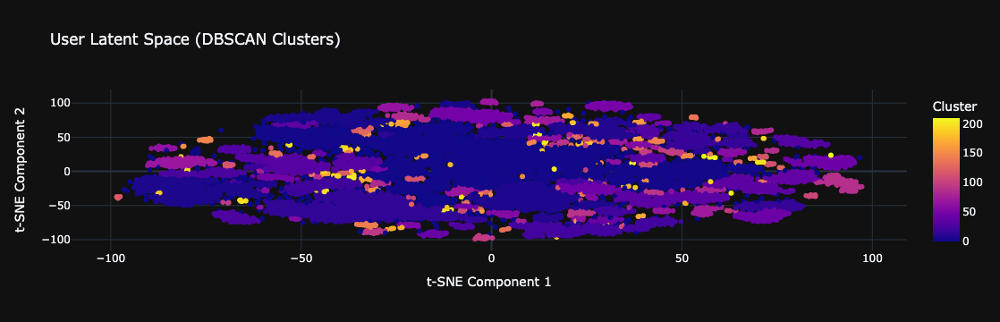

In [19]:
dbscan = DBSCAN(eps=1.9, min_samples=5, metric='euclidean')  # You may need to adjust these hyperparameters
cluster_labels = dbscan.fit_predict(X_tsne)

# Add cluster labels to the DataFrame
df = pd.DataFrame(X_tsne, columns=["TSNE Component 1", "TSNE Component 2"])
df['Cluster'] = cluster_labels

# Visualize the result using Plotly
fig = px.scatter(df, x="TSNE Component 1", y="TSNE Component 2", color="Cluster",
                 title="User Latent Space with DBSCAN Clusters",
                 labels={"TSNE Component 1": "Dimension 1", "TSNE Component 2": "Dimension 2"},
                 template="plotly_dark")  # Optional: use "plotly_dark" or other templates

# Update layout for better readability
fig.update_layout(
    title="User Latent Space (DBSCAN Clusters)",
    xaxis_title="t-SNE Component 1",
    yaxis_title="t-SNE Component 2",
    showlegend=True  # Show the legend to display the cluster colors
)

# Show the interactive plot
fig.show()

In [20]:
print(f"Number of clusters found: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise points (labeled -1): {list(cluster_labels).count(-1)}")

Number of clusters found: 211
Number of noise points (labeled -1): 717


In [21]:
cluster_labels

array([ 0,  1,  2, ...,  1, 14, 39])

In [22]:
df.head()

,TSNE Component 1,TSNE Component 2,Cluster
0,-14.119447,-35.864281,0
1,-55.866211,52.591461,1
2,38.880062,1.507839,2
3,-16.879784,50.859344,1
4,38.975315,-8.565986,2


In [25]:
user_ids = list(user_embeddings.keys())

In [26]:
df = pd.DataFrame({
    "User ID": user_ids,
    "TSNE Component 1": X_tsne[:, 0],
    "TSNE Component 2": X_tsne[:, 1],
    "Cluster": cluster_labels
})

df = pd.DataFrame({
    "User ID": user_ids,
    "TSNE Component 1": X_tsne[:, 0],
    "TSNE Component 2": X_tsne[:, 1],
    "Cluster": cluster_labels
})

In [28]:
df.to_csv('runs/simgcl/user_clusters.csv', index=False)